<a href="https://colab.research.google.com/github/Vijaypurushoth988373/Dog-vs-Cat-Classification/blob/main/Dog_vs_Cat_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning

It is a Deep Learning technique where we use a **pre-trained model**. This **pre-trained model** is trained for **one task** and can be re-trained for a similar task with a **smaller dataset**.

**Examples of Pre-Trained Models :**
1. VGG-16
2. ResNet50
3. Inceptionv3
4. MobileNetV2

Extracting Dataset using Kaggle API

In [ ]:
# installing the kaggle library
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# configuring the path of the kaggle .json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c dogs-vs-cats

dogs-vs-cats.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
# Extracting the Compressed Dataset
from zipfile import ZipFile

dataset='/content/dogs-vs-cats.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
# Extracting the Compressed Dataset
from zipfile import ZipFile

dataset='/content/train.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
import os
#Counting the no of files in train folder
path, dirs, files = next(os.walk('/content/train'))

In [ ]:
file_count=len(files)
print('Total Images :', file_count)

Total Images : 25000


In [ ]:
file_names = os.listdir('/content/train')
print(file_names)

['cat.190.jpg', 'cat.11366.jpg', 'dog.12282.jpg', 'dog.9393.jpg', 'dog.6268.jpg', 'dog.6835.jpg', 'dog.5078.jpg', 'dog.7463.jpg', 'dog.7551.jpg', 'cat.11044.jpg', 'dog.3598.jpg', 'dog.10970.jpg', 'cat.725.jpg', 'cat.8100.jpg', 'dog.1816.jpg', 'cat.3696.jpg', 'dog.2963.jpg', 'cat.822.jpg', 'cat.8504.jpg', 'cat.4109.jpg', 'dog.6182.jpg', 'dog.1937.jpg', 'cat.9999.jpg', 'cat.10061.jpg', 'cat.12402.jpg', 'dog.9964.jpg', 'cat.9875.jpg', 'cat.11989.jpg', 'cat.11232.jpg', 'cat.6266.jpg', 'cat.7294.jpg', 'cat.11749.jpg', 'dog.2160.jpg', 'dog.5574.jpg', 'dog.7523.jpg', 'dog.3004.jpg', 'dog.2215.jpg', 'cat.9915.jpg', 'dog.3585.jpg', 'cat.4202.jpg', 'dog.10664.jpg', 'cat.8225.jpg', 'dog.2419.jpg', 'dog.1779.jpg', 'dog.3605.jpg', 'dog.12243.jpg', 'cat.293.jpg', 'dog.3643.jpg', 'dog.7546.jpg', 'cat.11760.jpg', 'cat.4895.jpg', 'dog.3232.jpg', 'cat.7959.jpg', 'cat.11786.jpg', 'dog.9508.jpg', 'dog.6101.jpg', 'dog.2927.jpg', 'cat.4004.jpg', 'cat.11524.jpg', 'cat.2890.jpg', 'dog.8978.jpg', 'dog.2497.jpg

Importing the required libraries

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

Displaying the Images of Dog and Cat

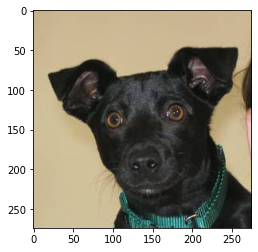

In [ ]:
# Display dog image
img = mpimg.imread('/content/train/dog.9393.jpg')
imgplt = plt.imshow(img)
plt.show()

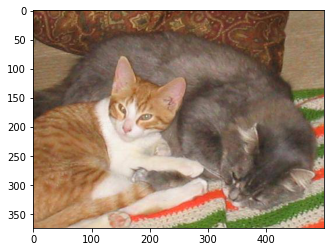

In [ ]:
# Display dog image
img = mpimg.imread('/content/train/cat.11366.jpg')
imgplt = plt.imshow(img)
plt.show()

In [ ]:
file_names = os.listdir('/content/train')

for i in range(5):
  name = file_names[i]
  print(name[0:3])

cat
cat
dog
dog
dog


In [ ]:
file_names = os.listdir('/content/train')
dog_count = 0
cat_count = 0
for img_file in file_names:
  name = img_file[0:3]
  if name == 'dog':
    dog_count += 1

  else:
    cat_count += 1

print(dog_count) 
print(cat_count) 

12500
12500


Resizing all the images

In [ ]:
# creating a directory for resized images

os.mkdir('/content/image_resize')

In [ ]:
original_folder = '/content/train/'
resized_folder = '/content/image_resize/'

In [ ]:
for i in range(2000):
  filename = os.listdir(original_folder)[i]
  img_path = original_folder+filename

  img = Image.open(img_path)
  img = img.resize((224,224))
  img = img.convert('RGB')
  newImagepath = resized_folder+filename
  img.save(newImagepath)

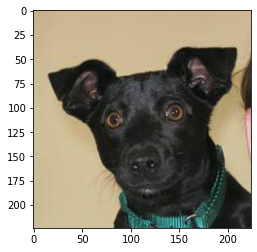

In [ ]:
# Display resize dog image
img = mpimg.imread('/content/image_resize/dog.9393.jpg')
imgplt = plt.imshow(img)
plt.show()

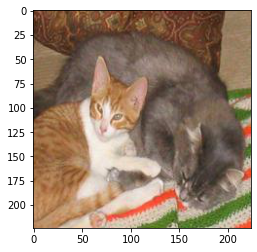

In [ ]:
# Display resize cat image
img = mpimg.imread('/content/image_resize/cat.11366.jpg')
imgplt = plt.imshow(img)
plt.show()

Creating labels for resized images of dogs and cats

*   Dog --> 1
*   Cat --> 0


In [ ]:
filenames = os.listdir('/content/image_resize')
labels = []
for i in range(2000):
  file_name = filenames[i]
  label = file_name[0:3]

  if label == 'dog':
    labels.append(1)
  else:
    labels.append(0)

In [ ]:
print(filenames[0:5])
print(len(filenames))

['cat.190.jpg', 'cat.11366.jpg', 'dog.12282.jpg', 'dog.9393.jpg', 'dog.6268.jpg']
2000


In [ ]:
print(labels[0:5])
print(len(labels))

[0, 0, 1, 1, 1]
2000


In [ ]:
values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)

[0 1]
[ 978 1022]


In [ ]:
import cv2
import glob

In [ ]:
image_directory = '/content/image_resize/'
image_extension = ['png', 'jpg']

files = []
[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]
dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [ ]:
print(dog_cat_images)

[[[[255 255 247]
   [248 254 243]
   [243 250 243]
   ...
   [ 43  73 102]
   [ 40  69 100]
   [ 32  61  92]]

  [[253 255 245]
   [247 253 242]
   [243 250 243]
   ...
   [ 49  79 108]
   [ 51  79 109]
   [ 43  73 102]]

  [[252 255 247]
   [246 254 244]
   [244 252 245]
   ...
   [ 54  83 110]
   [ 61  88 115]
   [ 52  81 108]]

  ...

  [[226 238 242]
   [224 236 240]
   [221 233 237]
   ...
   [206 217 225]
   [201 212 220]
   [202 213 221]]

  [[231 243 247]
   [227 239 243]
   [221 233 237]
   ...
   [210 221 229]
   [205 216 224]
   [206 217 225]]

  [[239 251 255]
   [232 244 248]
   [224 236 240]
   ...
   [210 221 229]
   [206 217 225]
   [207 218 226]]]


 [[[ 80 105 147]
   [ 48  73 115]
   [ 58  83 127]
   ...
   [109 138 165]
   [105 134 161]
   [100 129 156]]

  [[ 38  63 105]
   [ 33  58 100]
   [ 43  68 112]
   ...
   [100 129 156]
   [ 96 125 152]
   [ 92 121 148]]

  [[ 20  43  88]
   [ 27  50  95]
   [ 32  55 101]
   ...
   [ 95 124 151]
   [ 96 125 152]
   [ 97 126

In [ ]:
type(dog_cat_images)

numpy.ndarray

In [ ]:
dog_cat_images.shape

(2000, 224, 224, 3)

In [ ]:
X = dog_cat_images
Y = np.asarray(labels)

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 2)
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(1600, 224, 224, 3) (400, 224, 224, 3) (1600,) (400,)


In [ ]:
# Scaling the Data
X_train_scale = X_train / 255
X_test_scale = X_test / 255

**Building The Neural Network**

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)

In [ ]:
num_of_classes = 2

model = tf.keras.Sequential([pretrained_model, tf.keras.layers.Dense(num_of_classes)])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2,260,546
Trainable params: 2,562
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
model.compile(optimizer = 'adam', loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics = ['acc'])

In [ ]:
model.fit(X_train_scale, Y_train, epochs = 5)

Epoch 1/5
50/50 [==============================] - 50s 904ms/step - loss: 0.1749 - acc: 0.9362
Epoch 2/5
50/50 [==============================] - 59s 1s/step - loss: 0.0614 - acc: 0.9819
Epoch 3/5
50/50 [==============================] - 54s 1s/step - loss: 0.0460 - acc: 0.9875
Epoch 4/5
50/50 [==============================] - 63s 1s/step - loss: 0.0372 - acc: 0.9912
Epoch 5/5
50/50 [==============================] - 61s 1s/step - loss: 0.0299 - acc: 0.9950


In [ ]:
score, acc = model.evaluate(X_test_scale, Y_test)
print('Test Loss = ', score)
print('accuracy = ', acc)

13/13 [==============================] - 23s 1s/step - loss: 0.0897 - acc: 0.9625
Test Loss =  0.08974078297615051
accuracy =  0.9624999761581421


Predictive System

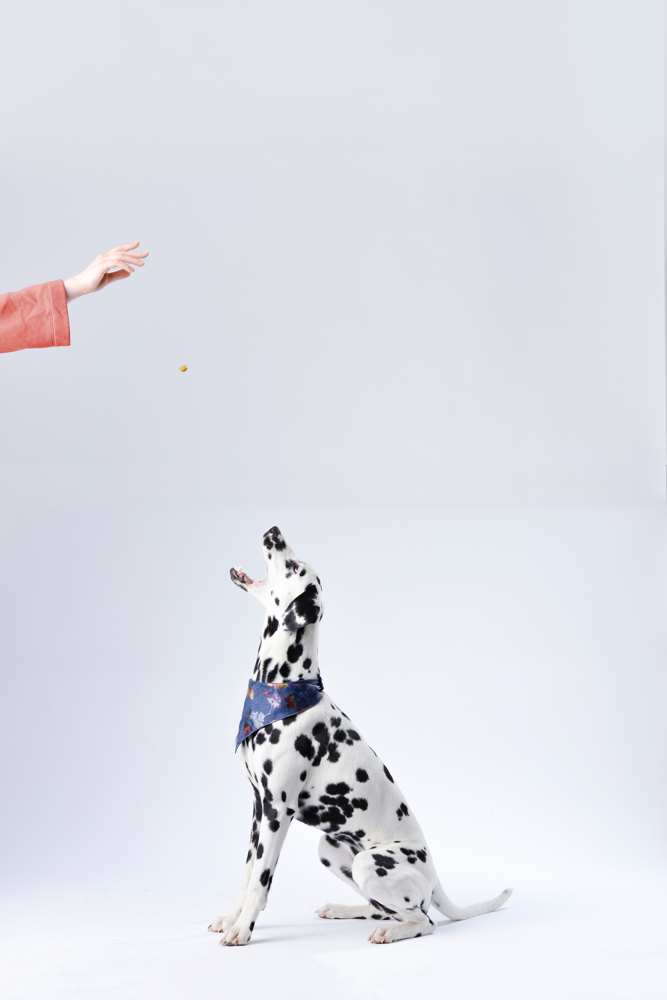

Dog


In [ ]:
input_image_path = input('Path of the Image : ')
input_image = cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize = cv2.resize(input_image, (224,224))
input_image_scaled = input_image_resize/255
image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])
input_pred = model.predict(image_reshaped)
input_pred_label = np.argmax(input_pred)

if input_pred_label == 0:
  print('Cat')
else:
  print('Dog')